# Computer Vision Project 1

Authors:
 - Jerzy Łukaszewicz 145458
 - Konrad Szewczyk 145466

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import PIL
import os
import scimage
from IPython.display import display, HTML

pd.options.display.html.border = 0
pd.options.display.float_format = '{:,.2f}'.format

In [2]:
if 'google.colab' in str(get_ipython()):
    from google.colab.patches import cv2_imshow
    imshow = cv2_imshow
else:
    def imshow(a):
        a = a.clip(0, 255).astype('uint8')
        if a.ndim == 3:
            if a.shape[2] == 4:
                a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
            else:
                a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
        display(PIL.Image.fromarray(a))

In [3]:
datapath = './data/'
resultpath = ''

In [4]:
result_img = cv2.imread('result.png', cv2.IMREAD_COLOR)

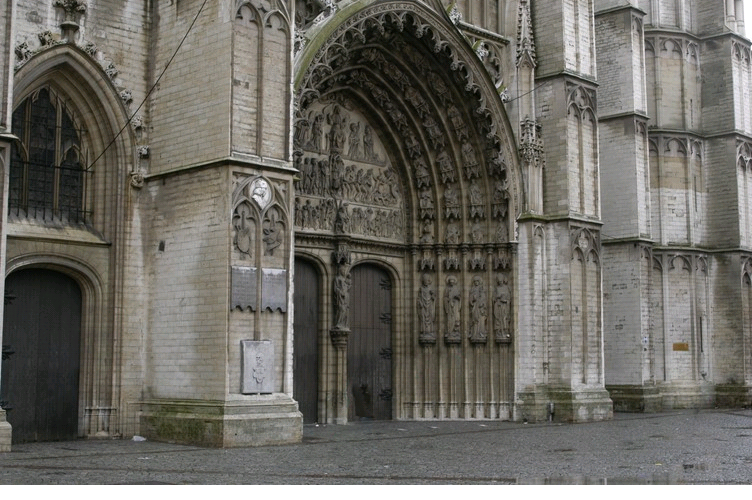

In [5]:
imshow(result_img)

In [6]:
images = [datapath + item for item in os.listdir(datapath)]

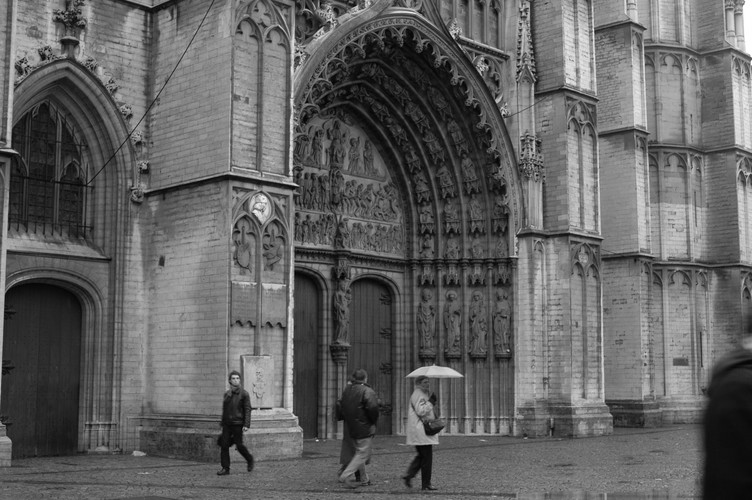

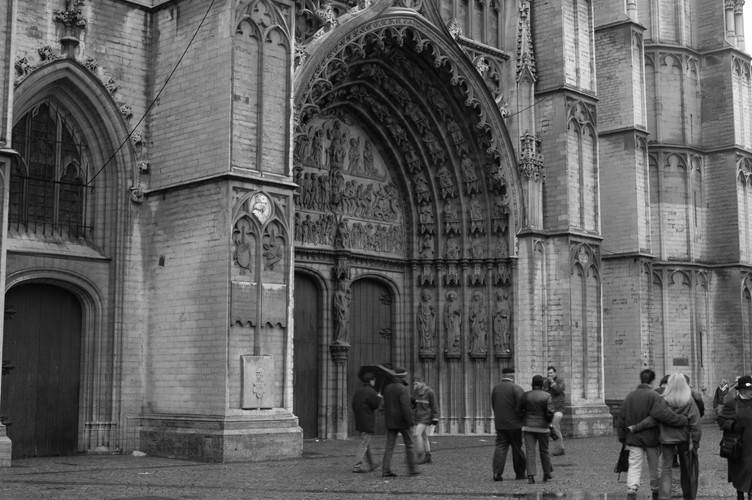

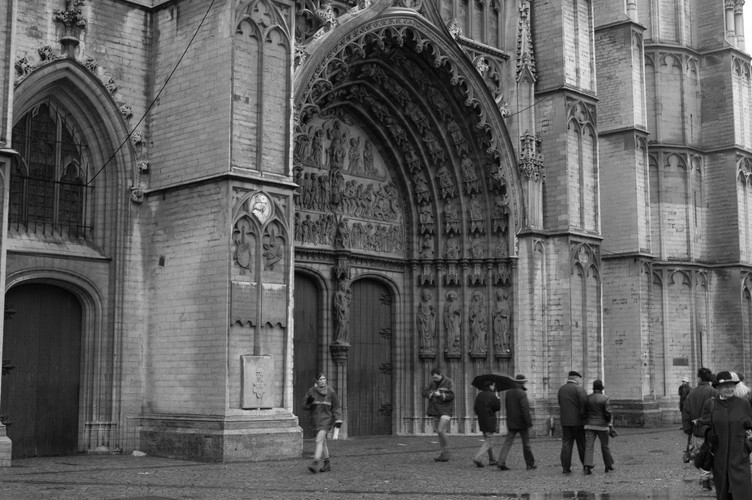

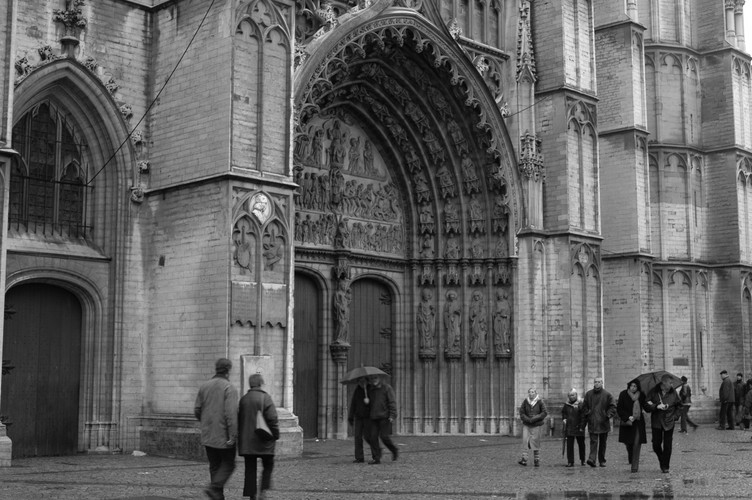

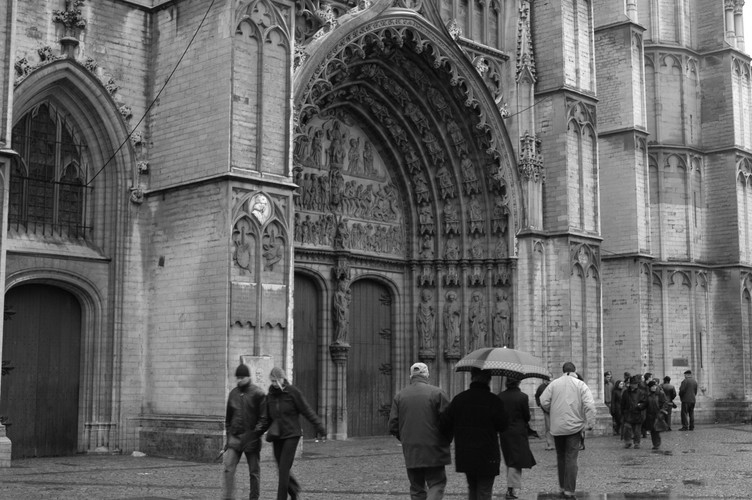

In [7]:
img_read = []
for img in images:
    img_n = cv2.imread(img, cv2.IMREAD_COLOR)
    img_n = cv2.cvtColor(img_n, cv2.COLOR_RGB2GRAY)
    img_read.append(img_n)
    imshow(img_n)

In [8]:
new_result = result_img.copy()
for i in range(new_result.shape[0]):
    for j in range(new_result.shape[1]):
        res = [[] for x in range(0,51)]
        for img in img_read:
            idx = img[i][j] // 5
            res[idx-1].append(img[i][j])
        list_len = max(res)
        px = np.mean(list_len).astype("uint8")
        new_result[i][j] = px

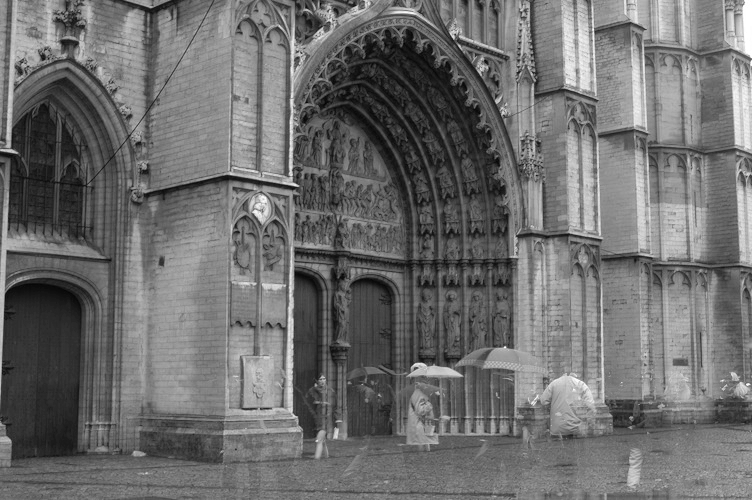

In [9]:
imshow(new_result)

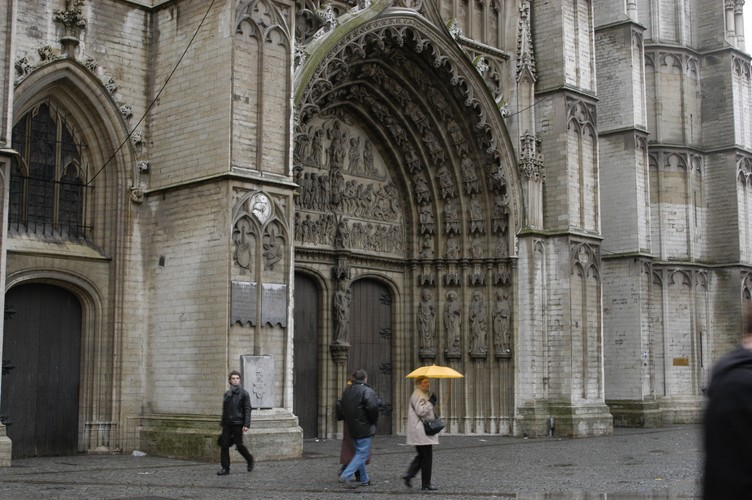

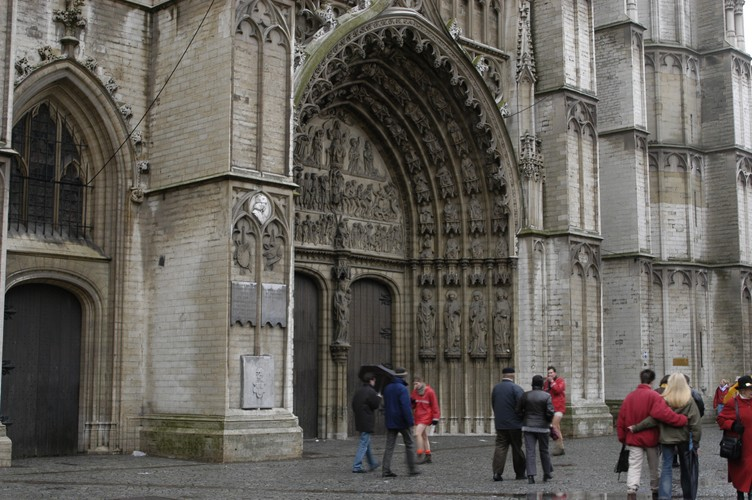

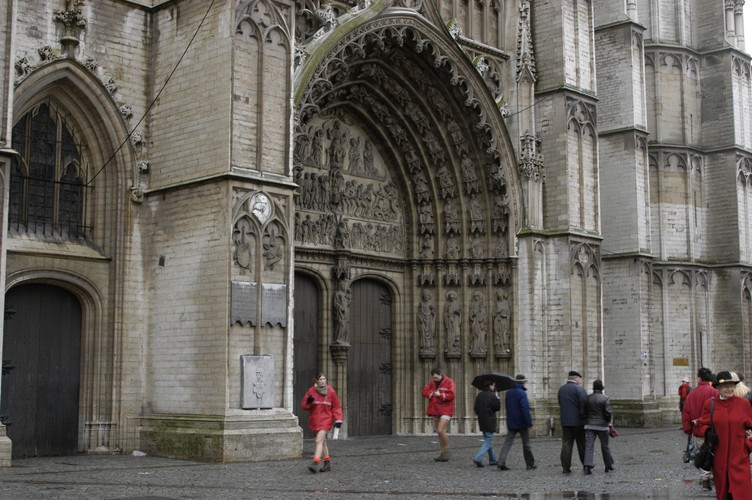

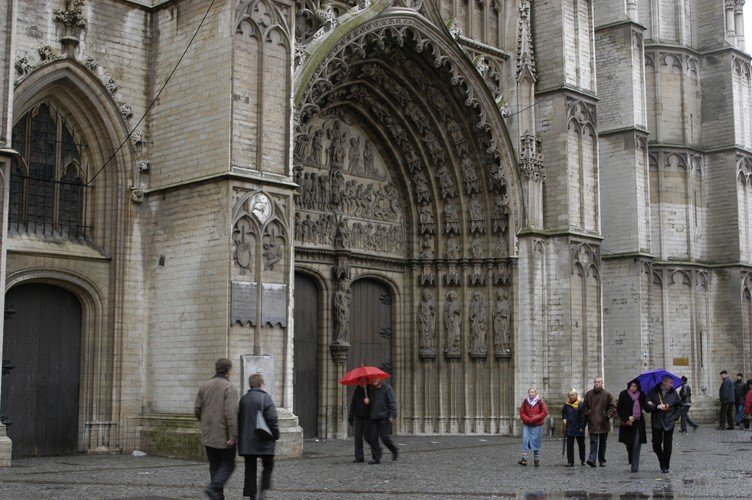

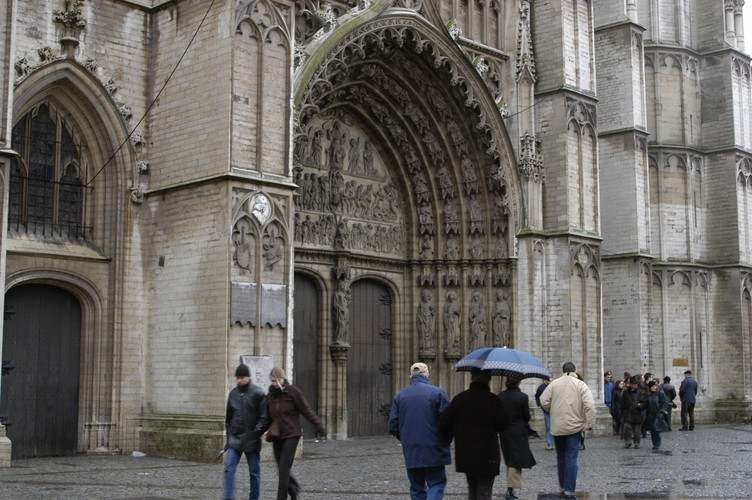

In [10]:
img_color = []
for img in images:
    img_n = cv2.imread(img, cv2.IMREAD_COLOR)
    img_color.append(img_n)
    imshow(img_n)

In [11]:
img_color[0].shape

(500, 752, 3)

In [12]:
from scipy import spatial

In [13]:
from itertools import combinations

In [14]:
new_result = np.zeros(result_img.shape)
for i in range(result_img.shape[0]):
    for j in range(result_img.shape[1]):
        pix = []
        for img_c in img_color:
            pix.append(img_c[i][j].astype(np.float32) / 255)
        """
        comb = list(combinations(pix, 2))
        cos = []
        for k in comb:
            sim = np.linalg.norm(k[0]-k[1])
            cos.append(1-sim)
        """
        mean_pix = np.mean(pix, axis=-2)
        cos = []
        for k in pix:
            sim = np.linalg.norm(k-mean_pix, 4)
            cos.append(1-sim)
        best = cos.index(max(cos))
        avg = pix[best]
        avg = np.floor(avg * 255)
        new_result[i][j]=avg.astype("uint8")

In [15]:
good_res = new_result.astype("uint8")

In [16]:
image = new_result.astype(np.uint8)

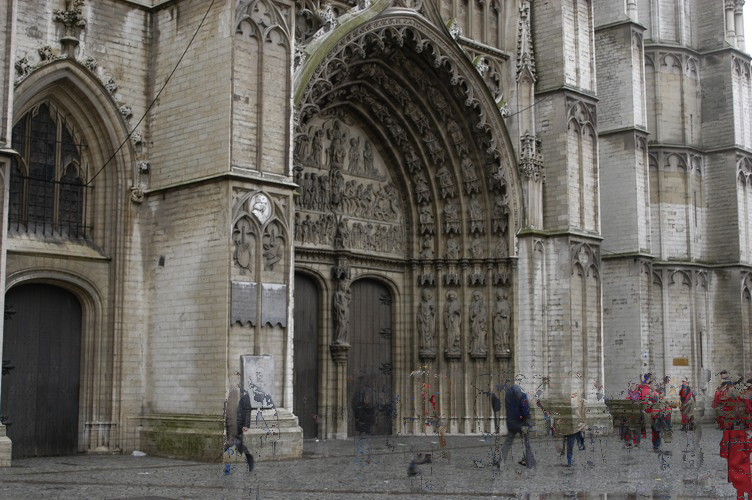

In [17]:
imshow(good_res)

In [18]:
close = cv2.morphologyEx(good_res, cv2.MORPH_CLOSE, (5,5))

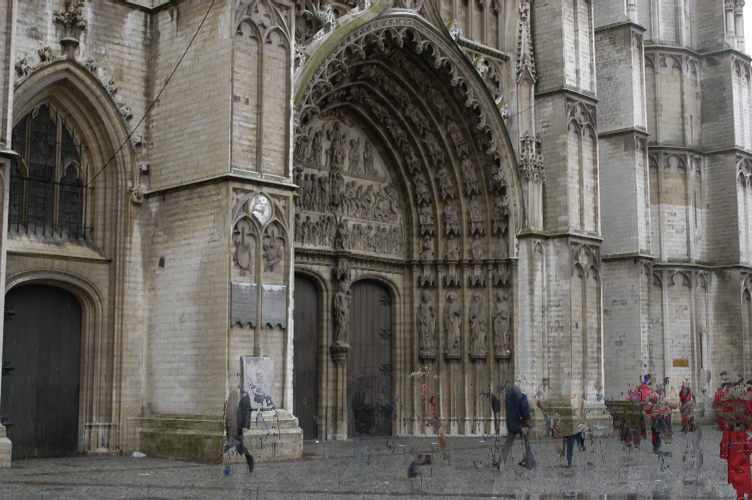

In [19]:
imshow(close)

In [20]:
def normalise_img(img):
    img = img.astype(np.float32)
    img_min = np.min(img, axis=(-3, -2))
    img_max = np.max(img, axis=(-3, -2))
    return ((img - img_min) / (img_min + img_max)).astype(np.float32)

In [21]:
weights = []
for img in img_color + [good_res,]:
    img = np.array(img)
    img_color_means = np.mean(img / 255, axis=-1, keepdims=True)
    test = 0.75 - np.max((np.absolute(img / 255 - img_color_means)), axis=-1) + np.min(img / 255, axis=-1) * 0.25
    #imshow(test**6 * 255)
    weights.append(test**5 * 255)

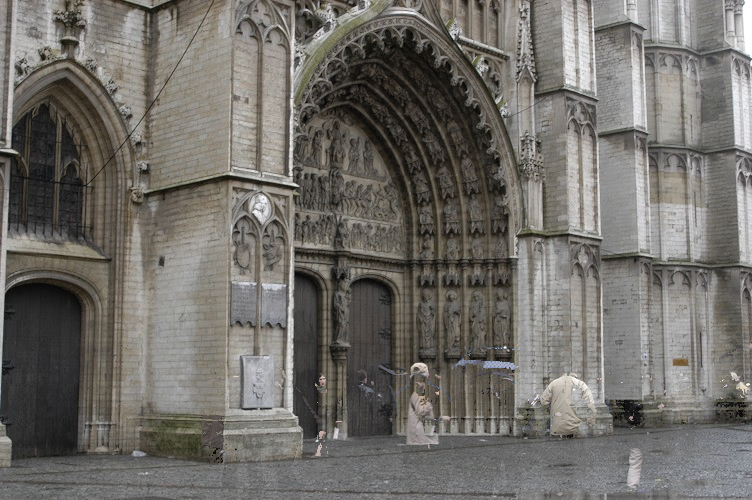

In [22]:
maps = []
new_result = np.zeros(result_img.shape)
for i in range(result_img.shape[0]):
    for j in range(result_img.shape[1]):
        best_weight = 0
        best_idx = None
        for idx, img_c in enumerate(img_color + [good_res, ]):
            if best_weight < weights[idx][i][j]:
                best_weight = weights[idx][i][j]
                best = img_c[i][j]
        """
        comb = list(combinations(pix, 2))
        cos = []
        for k in comb:
            sim = np.linalg.norm(k[0]-k[1])
            cos.append(1-sim)
        
        mean_pix = np.mean(pix, axis=-2)
        cos = []
        for k in pix:
            sim = np.linalg.norm(k-mean_pix, 4)
            cos.append(1-sim)
        best = cos.index(max(cos))
        avg = pix[best]
        avg = np.floor(avg * 255)
        """
        new_result[i][j]=best

imshow(new_result)

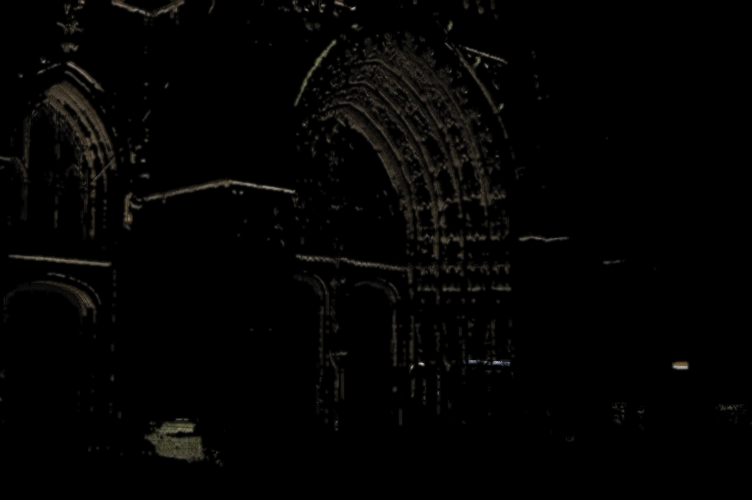

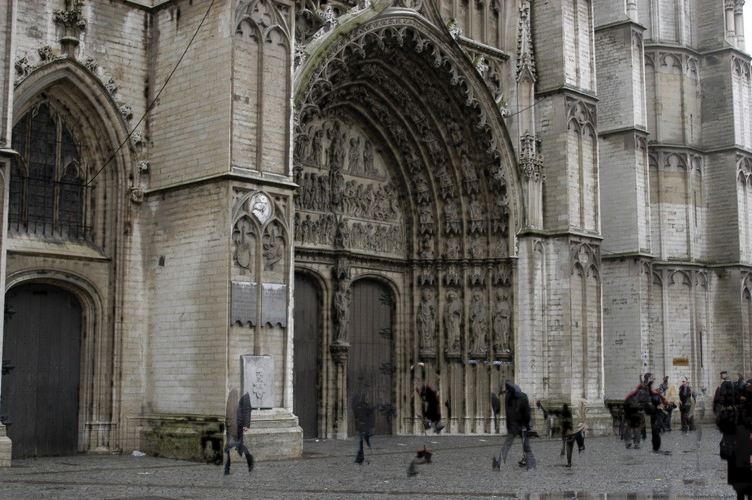

In [23]:
temps = []
temp_imgs = []
for idx, weight in enumerate(weights[:-1]):
    w = (weight > 65) * 255
    temp = cv2.morphologyEx(w.astype(np.uint8), cv2.MORPH_OPEN, (11, 11))
    temp = cv2.morphologyEx(temp, cv2.MORPH_CLOSE, (11, 11))
    temp = cv2.morphologyEx(temp.astype(np.uint8), cv2.MORPH_OPEN, (11, 11))
    temp = cv2.GaussianBlur(temp, (9, 9), 1)
    temps.append(temp)
    temp_img = np.stack([temp, temp, temp], axis=-1) / 255 * img_color[idx]
    temp_imgs.append(temp_img)

temp_1 = np.median(temp_imgs, axis=0)
maxi = (1 - np.max(temps, axis=0) / 255)
temp_2 = new_result * np.stack([maxi] * 3, axis=-1)
imshow(temp_2)
imshow(np.mean((temp_1, temp_2), axis=(0)) * 2)
temp_res = np.mean((temp_1, temp_2), axis=(0)) * 2

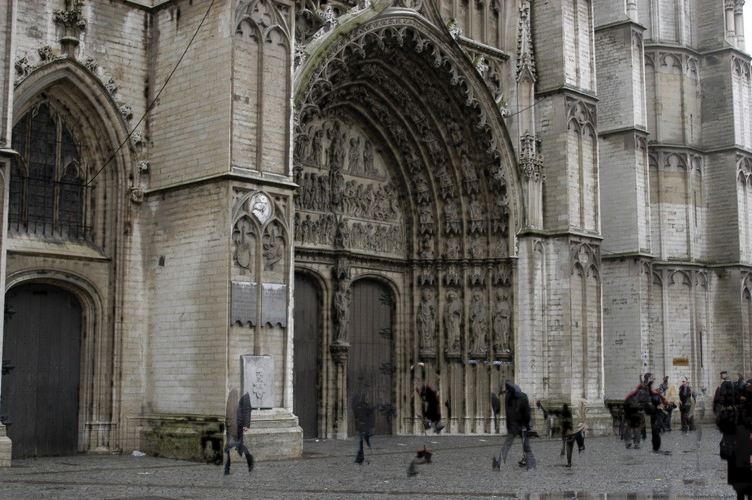

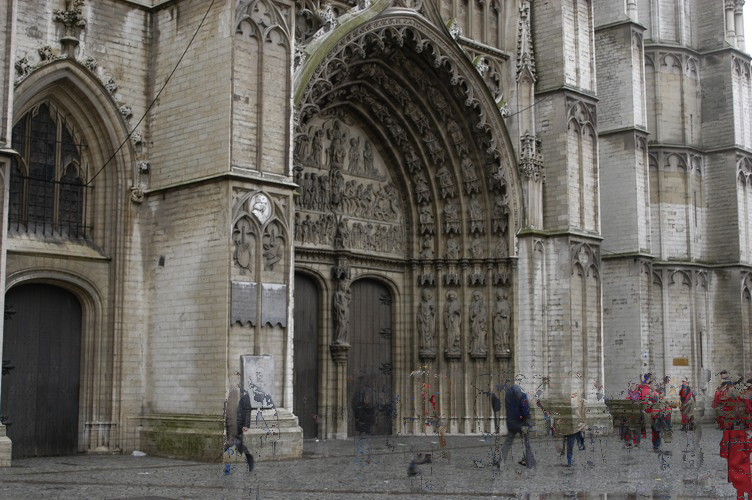

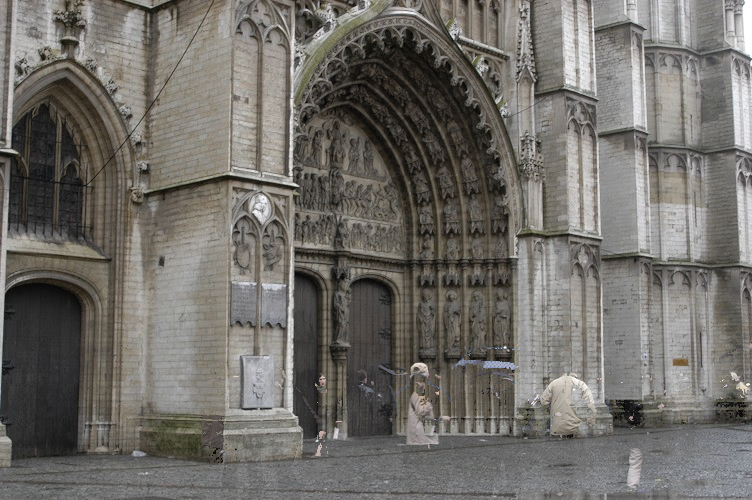

In [24]:
imshow(temp_res)
imshow(good_res)
imshow(new_result)

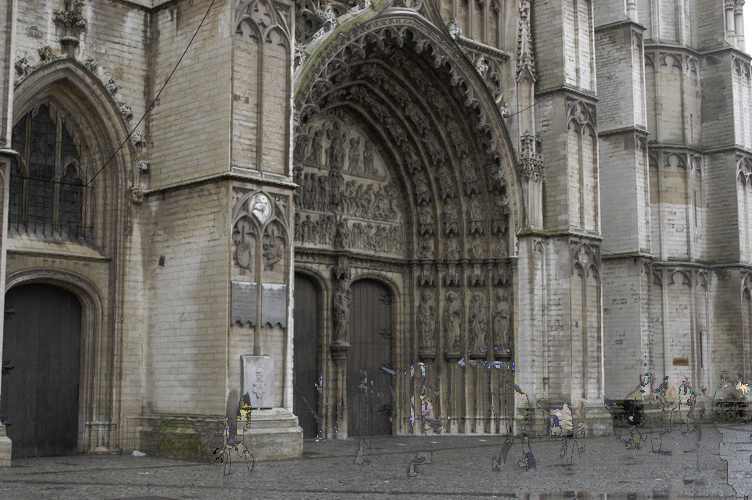

In [25]:
### Inaczej threshold bym musiał dobierać, ale to mogę jutro zrobić
imshow(np.where(temp_res < 50, new_result, temp_res))

In [70]:
better = np.where(temp_res < 50, new_result, temp_res)

In [122]:
better[420:,640:,]=new_result[420:,640:]
better[450:,:628]= new_result[450:,:628]
better[:,:353] = img_color[1][:,:353]
better[:,700:] = img_color[4][:,700:]
better[:,398:518] = img_color[3][:,398:518]
better[:,480:695] = img_color[0][:,480:695]
better[:,345:420] = img_color[2][:,345:420]

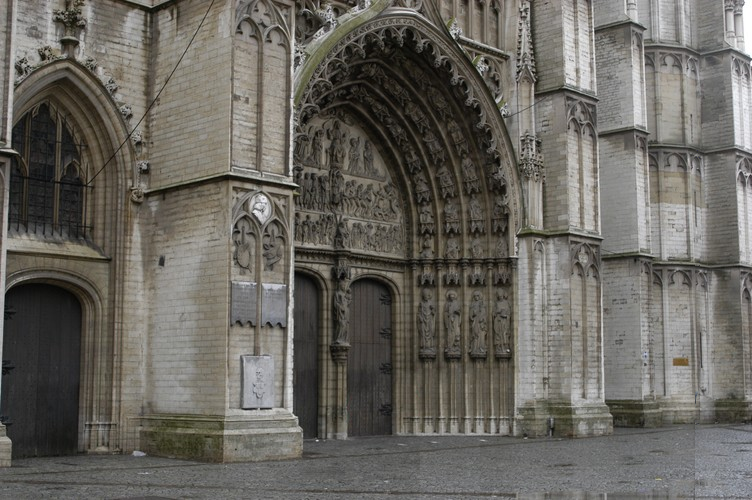

In [123]:
imshow(better)